In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df=pd.read_csv("austo_automobile+(2)+(1).csv")
df

,Age,Gender,Profession,Marital_status,Education,No_of_Dependents,Personal_loan,House_loan,Partner_working,Salary,Partner_salary,Total_salary,Price,Make
0,53,Male,Business,Married,Post Graduate,4,No,No,Yes,99300,70700.0,170000,61000,SUV
1,53,Femal,Salaried,Married,Post Graduate,4,Yes,No,Yes,95500,70300.0,165800,61000,SUV
2,53,Female,Salaried,Married,Post Graduate,3,No,No,Yes,97300,60700.0,158000,57000,SUV
3,53,Female,Salaried,Married,Graduate,2,Yes,No,Yes,72500,70300.0,142800,61000,SUV
4,53,Male,Salaried,Married,Post Graduate,3,No,No,Yes,79700,60200.0,139900,57000,SUV
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1576,22,Male,Salaried,Single,Graduate,2,No,Yes,No,33300,0.0,33300,27000,Hatchback
1577,22,Male,Business,Married,Graduate,4,No,No,No,32000,NaN,32000,31000,Hatchback
1578,22,Male,Business,Single,Graduate,2,No,Yes,No,32900,0.0,32900,30000,Hatchback
1579,22,Male,Business,Married,Graduate,3,Yes,Yes,No,32200,NaN,32200,24000,Hatchback


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1581 entries, 0 to 1580
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Age               1581 non-null   int64  
 1   Gender            1528 non-null   object 
 2   Profession        1581 non-null   object 
 3   Marital_status    1581 non-null   object 
 4   Education         1581 non-null   object 
 5   No_of_Dependents  1581 non-null   int64  
 6   Personal_loan     1581 non-null   object 
 7   House_loan        1581 non-null   object 
 8   Partner_working   1581 non-null   object 
 9   Salary            1581 non-null   int64  
 10  Partner_salary    1475 non-null   float64
 11  Total_salary      1581 non-null   int64  
 12  Price             1581 non-null   int64  
 13  Make              1581 non-null   object 
dtypes: float64(1), int64(5), object(8)
memory usage: 173.0+ KB


#### There are 1581 rows and 14 columns were present in dataset

#### There are 6 numerical variable and 8 categorical variable were present in dataset

In [4]:
df.describe()

,Age,No_of_Dependents,Salary,Partner_salary,Total_salary,Price
count,1581.000000,1581.000000,1581.000000,1475.000000,1581.000000,1581.000000
mean,31.922201,2.457938,60392.220114,20225.559322,79625.996205,35597.722960
std,8.425978,0.943483,14674.825044,19573.149277,25545.857768,13633.636545
min,22.000000,0.000000,30000.000000,0.000000,30000.000000,18000.000000
25%,25.000000,2.000000,51900.000000,0.000000,60500.000000,25000.000000
50%,29.000000,2.000000,59500.000000,25600.000000,78000.000000,31000.000000
75%,38.000000,3.000000,71800.000000,38300.000000,95900.000000,47000.000000
max,54.000000,4.000000,99300.000000,80500.000000,171000.000000,70000.000000


## Data Pre-processing

In [5]:
df.duplicated().sum()

0

In [6]:
df.isnull().sum()

Age                   0
Gender               53
Profession            0
Marital_status        0
Education             0
No_of_Dependents      0
Personal_loan         0
House_loan            0
Partner_working       0
Salary                0
Partner_salary      106
Total_salary          0
Price                 0
Make                  0
dtype: int64

#### Gender has 53 null values and Partner_salary has 106 null values were resent in the dataset

In [7]:
df['Gender'].unique()

array(['Male', 'Femal', 'Female', nan, 'Femle'], dtype=object)

In [8]:
#### Gender column has misspelled objects, So, we use replace function for correcting spellings

In [9]:
df['Gender'].value_counts()

Male      1199
Female     327
Femal        1
Femle        1
Name: Gender, dtype: int64

In [10]:
df['Gender'].mode()

0    Male
Name: Gender, dtype: object

#### The Mode value of Gender is Male, so we can use mode value to impute null values in Gender column.

#### Partner_salary has null values, so checking for any outliers using Boxplot visualization.

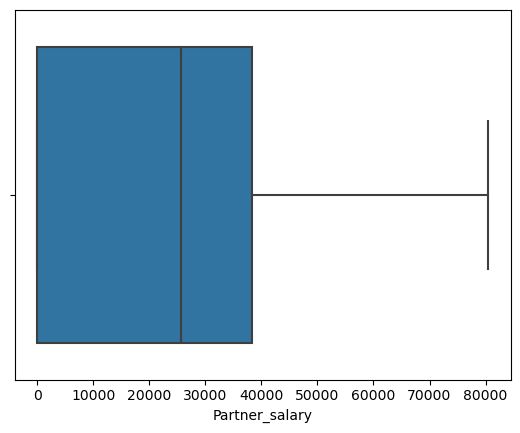

In [11]:
sns.boxplot(data=df, x='Partner_salary');

#### Since this feature has no possible outliers , we can use mean to impute null values.

In [12]:
df['Partner_salary'].mean()

20225.5593220339

#### The Mean value of Partner_salary is 20225.559, so we can use mean value to impute null values in Partner_salary features.

In [13]:
df['Gender'] = df['Gender'].replace(np.nan,df['Gender'].mode()[0])
df['Partner_salary'] = df['Partner_salary'].replace(np.nan,df['Partner_salary'].mean())

In [14]:
df['Gender'] = df['Gender'].replace('Femal','Female')
df['Gender'] = df['Gender'].replace('Femle','Female')

In [15]:
df['Gender'].value_counts()

Male      1252
Female     329
Name: Gender, dtype: int64

In [16]:
df.isnull().sum()

Age                 0
Gender              0
Profession          0
Marital_status      0
Education           0
No_of_Dependents    0
Personal_loan       0
House_loan          0
Partner_working     0
Salary              0
Partner_salary      0
Total_salary        0
Price               0
Make                0
dtype: int64

#### So all the Null values and spelling mistakes has been corrected using replace function. 

In [17]:
df.describe()

,Age,No_of_Dependents,Salary,Partner_salary,Total_salary,Price
count,1581.000000,1581.000000,1581.000000,1581.000000,1581.000000,1581.000000
mean,31.922201,2.457938,60392.220114,20225.559322,79625.996205,35597.722960
std,8.425978,0.943483,14674.825044,18905.183912,25545.857768,13633.636545
min,22.000000,0.000000,30000.000000,0.000000,30000.000000,18000.000000
25%,25.000000,2.000000,51900.000000,0.000000,60500.000000,25000.000000
50%,29.000000,2.000000,59500.000000,24900.000000,78000.000000,31000.000000
75%,38.000000,3.000000,71800.000000,38000.000000,95900.000000,47000.000000
max,54.000000,4.000000,99300.000000,80500.000000,171000.000000,70000.000000


### Checking for Outliers

#### Plotting the box plots to find Outliers

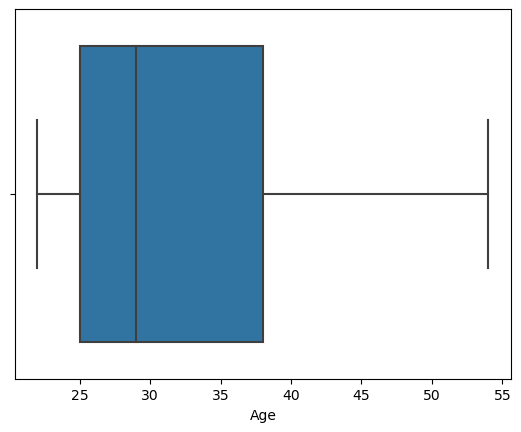

count    1581.000000
mean       31.922201
std         8.425978
min        22.000000
25%        25.000000
50%        29.000000
75%        38.000000
max        54.000000
Name: Age, dtype: float64

In [18]:
sns.boxplot(data=df, x='Age');
plt.show()
df['Age'].describe()

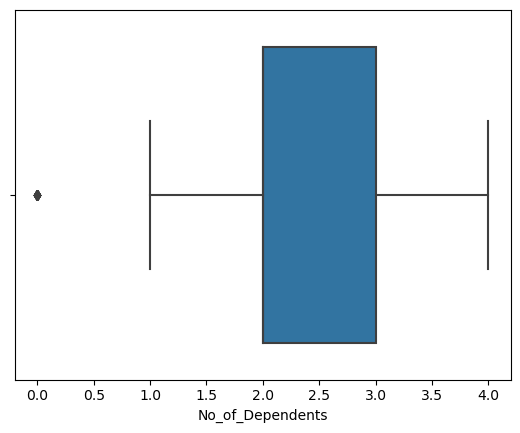

count    1581.000000
mean        2.457938
std         0.943483
min         0.000000
25%         2.000000
50%         2.000000
75%         3.000000
max         4.000000
Name: No_of_Dependents, dtype: float64

In [19]:
sns.boxplot(data=df, x='No_of_Dependents');
plt.show()
df['No_of_Dependents'].describe()

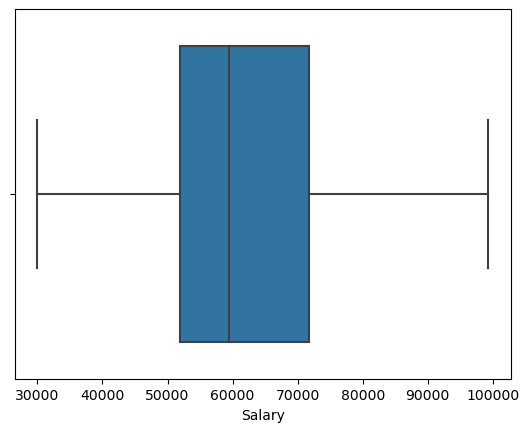

count     1581.000000
mean     60392.220114
std      14674.825044
min      30000.000000
25%      51900.000000
50%      59500.000000
75%      71800.000000
max      99300.000000
Name: Salary, dtype: float64

In [20]:
sns.boxplot(data=df, x='Salary');
plt.show()
df['Salary'].describe()

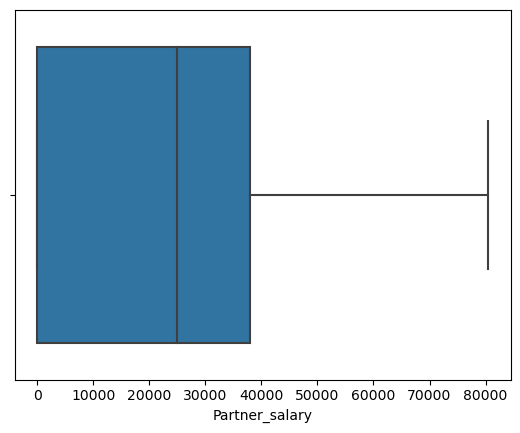

count     1581.000000
mean     20225.559322
std      18905.183912
min          0.000000
25%          0.000000
50%      24900.000000
75%      38000.000000
max      80500.000000
Name: Partner_salary, dtype: float64

In [21]:
sns.boxplot(data=df, x='Partner_salary');
plt.show()
df['Partner_salary'].describe()

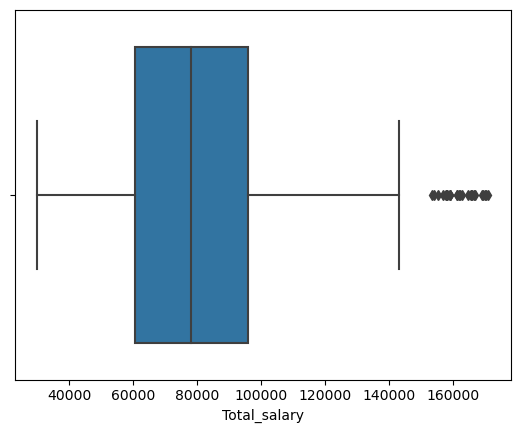

count      1581.000000
mean      79625.996205
std       25545.857768
min       30000.000000
25%       60500.000000
50%       78000.000000
75%       95900.000000
max      171000.000000
Name: Total_salary, dtype: float64

In [22]:
sns.boxplot(data=df, x='Total_salary');
plt.show()
df['Total_salary'].describe()

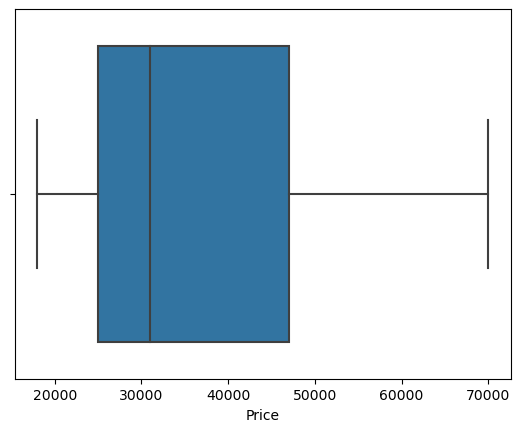

count     1581.000000
mean     35597.722960
std      13633.636545
min      18000.000000
25%      25000.000000
50%      31000.000000
75%      47000.000000
max      70000.000000
Name: Price, dtype: float64

In [23]:
sns.boxplot(data=df, x='Price');
plt.show()
df['Price'].describe()

#### Looking at the box plot, it seems that these two variables No_of_Dependents and Total_salary have outliers.

#### Replacing the outlier value using the IQR

In [24]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [25]:
lr,ur=remove_outlier(df['No_of_Dependents'])
print("lower range",lr, "and upper range", ur)

lower range 0.5 and upper range 4.5


In [26]:
df['No_of_Dependents']=np.where(df['No_of_Dependents']>ur,ur,df['No_of_Dependents'])
df['No_of_Dependents']=np.where(df['No_of_Dependents']<lr,lr,df['No_of_Dependents'])

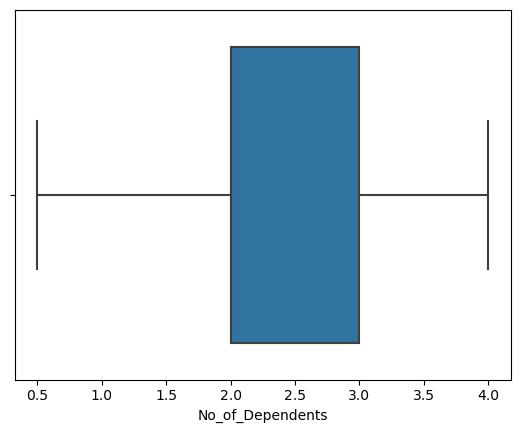

In [27]:
sns.boxplot(data=df, x='No_of_Dependents');

#### Boxplots after Outlier Treatment for the variable No_of_Dependents

In [28]:
lr,ur=remove_outlier(df['Total_salary'])
print("lower range",lr, "and upper range", ur)

lower range 7400.0 and upper range 149000.0


In [29]:
df['Total_salary']=np.where(df['Total_salary']>ur,ur,df['Total_salary'])
df['Total_salary']=np.where(df['Total_salary']<lr,lr,df['Total_salary'])

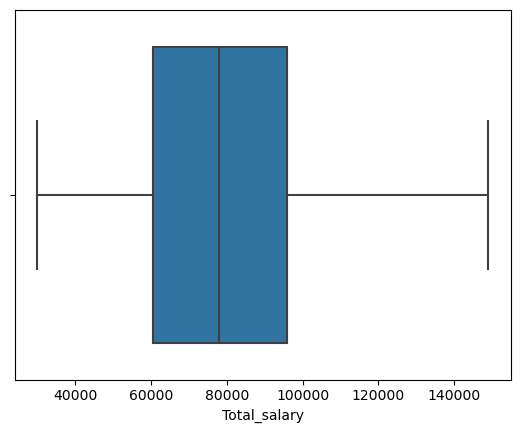

In [30]:
sns.boxplot(data=df, x='Total_salary');

#### Boxplots after Outlier Treatment for the variable Total_salary

In [31]:
df.head()

,Age,Gender,Profession,Marital_status,Education,No_of_Dependents,Personal_loan,House_loan,Partner_working,Salary,Partner_salary,Total_salary,Price,Make
0,53,Male,Business,Married,Post Graduate,4.0,No,No,Yes,99300,70700.0,149000.0,61000,SUV
1,53,Female,Salaried,Married,Post Graduate,4.0,Yes,No,Yes,95500,70300.0,149000.0,61000,SUV
2,53,Female,Salaried,Married,Post Graduate,3.0,No,No,Yes,97300,60700.0,149000.0,57000,SUV
3,53,Female,Salaried,Married,Graduate,2.0,Yes,No,Yes,72500,70300.0,142800.0,61000,SUV
4,53,Male,Salaried,Married,Post Graduate,3.0,No,No,Yes,79700,60200.0,139900.0,57000,SUV


In [32]:
df['Profession'].value_counts()

Salaried    896
Business    685
Name: Profession, dtype: int64

In [33]:
df['Marital_status'].value_counts()

Married    1443
Single      138
Name: Marital_status, dtype: int64

In [34]:
df['Education'].value_counts()

Post Graduate    985
Graduate         596
Name: Education, dtype: int64

In [35]:
df['Personal_loan'].value_counts()

Yes    792
No     789
Name: Personal_loan, dtype: int64

In [36]:
df['House_loan'].value_counts()

No     1054
Yes     527
Name: House_loan, dtype: int64

In [37]:
df['Partner_working'].value_counts()

Yes    868
No     713
Name: Partner_working, dtype: int64

In [38]:
df['Make'].value_counts()

Sedan        702
Hatchback    582
SUV          297
Name: Make, dtype: int64

In [39]:
dups = df.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))

df[dups]

Number of duplicate rows = 0


,Age,Gender,Profession,Marital_status,Education,No_of_Dependents,Personal_loan,House_loan,Partner_working,Salary,Partner_salary,Total_salary,Price,Make


In [40]:
df[['Age','Total_salary','Price']].describe()

,Age,Total_salary,Price
count,1581.000000,1581.000000,1581.000000
mean,31.922201,79398.545225,35597.722960
std,8.425978,24849.147996,13633.636545
min,22.000000,30000.000000,18000.000000
25%,25.000000,60500.000000,25000.000000
50%,29.000000,78000.000000,31000.000000
75%,38.000000,95900.000000,47000.000000
max,54.000000,149000.000000,70000.000000


Age ranges from a minimum of 22 year to maximum of 54 years

75% of the Total salary have less than or equal to 95900.

### Data Visualization

#### Univariate Analysis

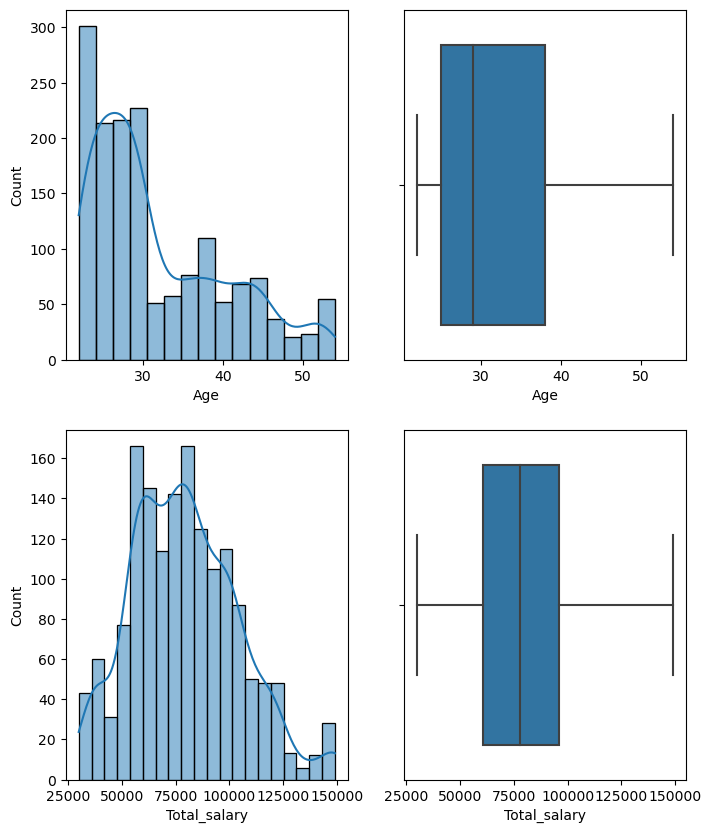

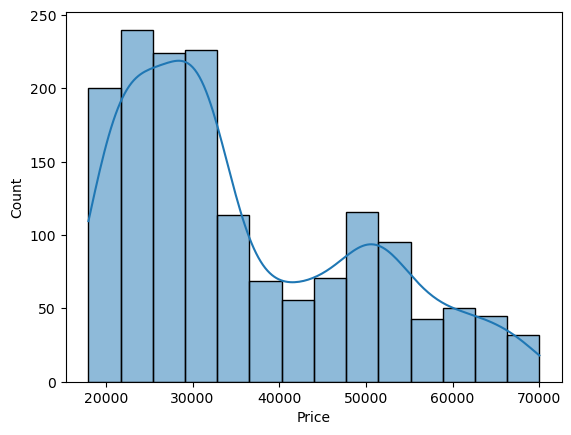

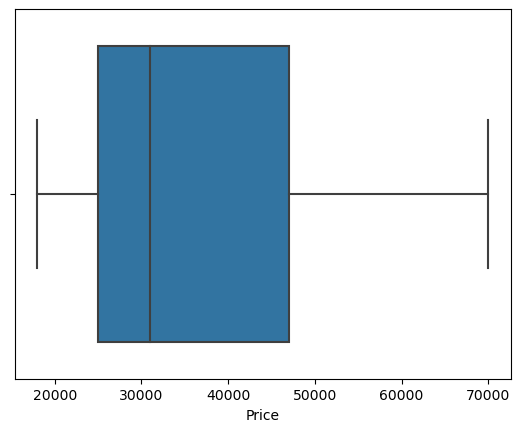

In [41]:
fig, axes = plt.subplots(nrows=2,ncols=2)
fig.set_size_inches(8,10)
sns.histplot(df['Age'], kde=True, ax=axes[0][0])
sns.boxplot(x='Age', data=df, ax=axes[0][1])
sns.histplot(df['Total_salary'], kde=True, ax=axes[1][0])
sns.boxplot(x='Total_salary', data=df, ax=axes[1][1])
plt.show()
fig.set_size_inches(8,8)
sns.histplot(df['Price'], kde=True)
plt.show()
fig.set_size_inches(8,8)
sns.boxplot(x='Price', data=df)
plt.show()

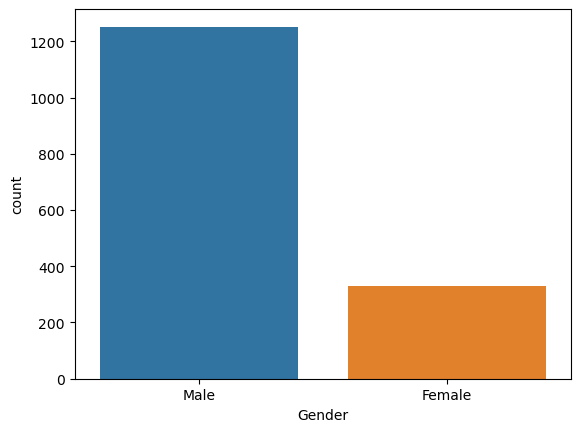

Male      79.190386
Female    20.809614
Name: Gender, dtype: float64

In [42]:
sns.countplot(data=df, x='Gender')
plt.show()
df['Gender'].value_counts(normalize=True)*100

#### As per dataset, 79% were male and 20.8% were female

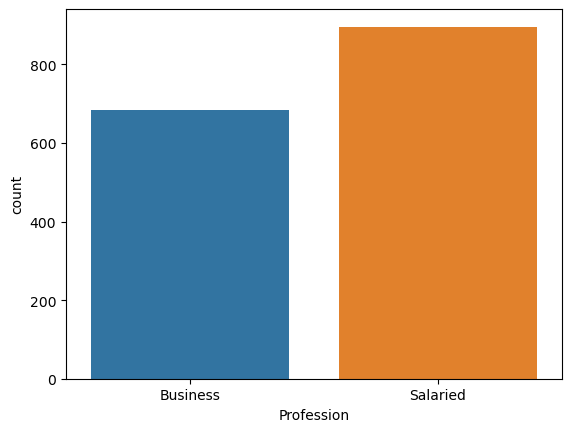

Salaried    56.672992
Business    43.327008
Name: Profession, dtype: float64

In [43]:
sns.countplot(data=df, x='Profession')
plt.show()
df['Profession'].value_counts(normalize=True)*100

#### 56.6% from salaried category and 43.3% from Business category was purchasing car

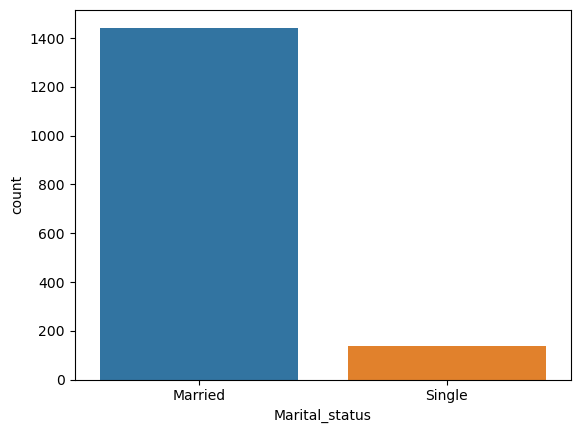

Married    91.271347
Single      8.728653
Name: Marital_status, dtype: float64

In [44]:
sns.countplot(data=df, x='Marital_status')
plt.show()
df['Marital_status'].value_counts(normalize=True)*100

 #### From 79% male and 20.8% female, 91.2% were married and 8.7% were single

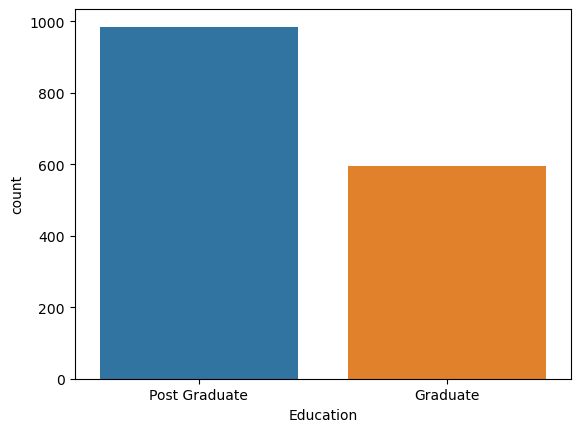

Post Graduate    62.30234
Graduate         37.69766
Name: Education, dtype: float64

In [45]:
sns.countplot(data=df, x='Education')
plt.show()
df['Education'].value_counts(normalize=True)*100

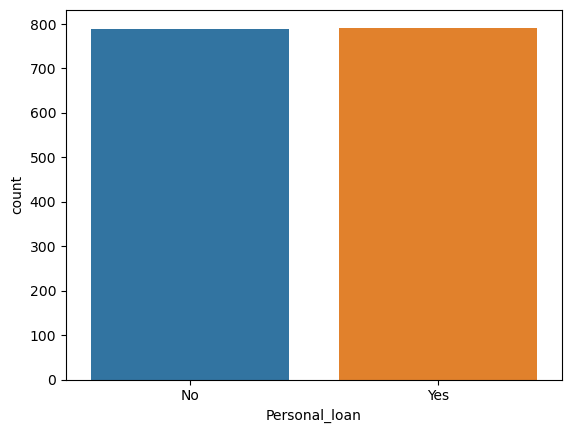

Yes    50.094877
No     49.905123
Name: Personal_loan, dtype: float64

In [46]:
sns.countplot(data=df, x='Personal_loan')
plt.show()
df['Personal_loan'].value_counts(normalize=True)*100

#### 50% of the people have availed the personal loan

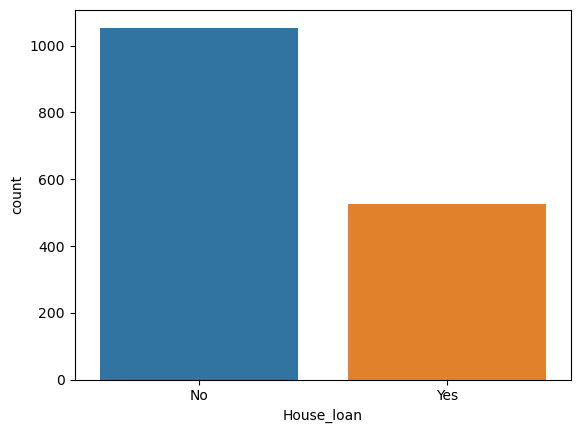

No     66.666667
Yes    33.333333
Name: House_loan, dtype: float64

In [47]:
sns.countplot(data=df, x='House_loan')
plt.show()
df['House_loan'].value_counts(normalize=True)*100

#### Only 33.33% of the people have availed the Housing Loan. 66.66% have not availed housing loan.

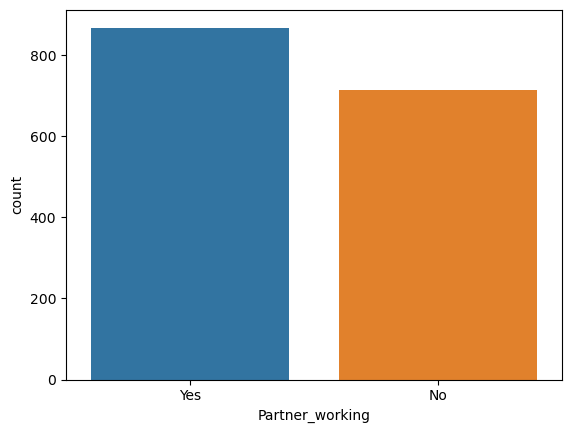

Yes    54.901961
No     45.098039
Name: Partner_working, dtype: float64

In [48]:
sns.countplot(data=df, x='Partner_working')
plt.show()
df['Partner_working'].value_counts(normalize=True)*100

#### From 79% male and 20.8% female, 91.2% were married. From 91.2% married, only 54.90% partners were working.

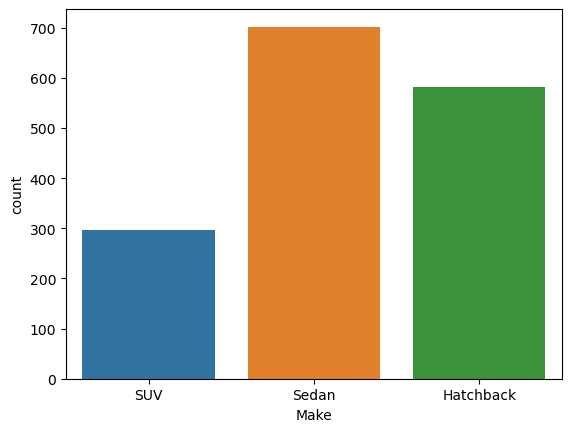

Sedan        44.402277
Hatchback    36.812144
SUV          18.785579
Name: Make, dtype: float64

In [49]:
sns.countplot(data=df, x='Make')
plt.show()
df['Make'].value_counts(normalize=True)*100

#### 44.4% sedan make have been bought by customer
#### 36.8% Hatchback model have been bought by customer
#### 18.7% SUV model have been bought by customer

### Bivariate Analysis

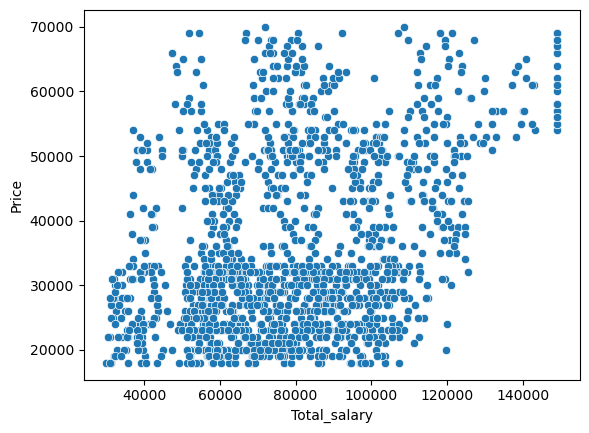

In [50]:
sns.scatterplot(data=df, x='Total_salary', y='Price');

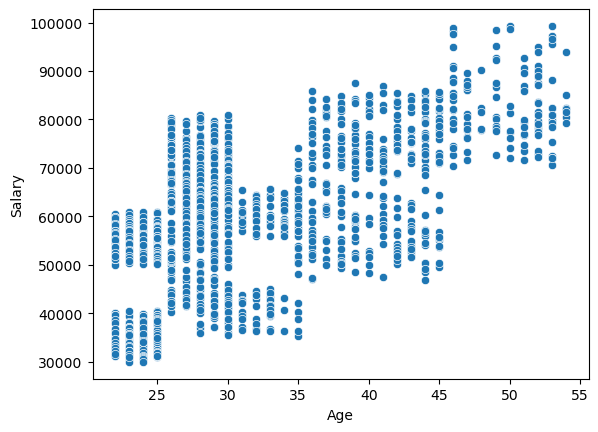

In [51]:
sns.scatterplot(data=df, x='Age', y='Salary');

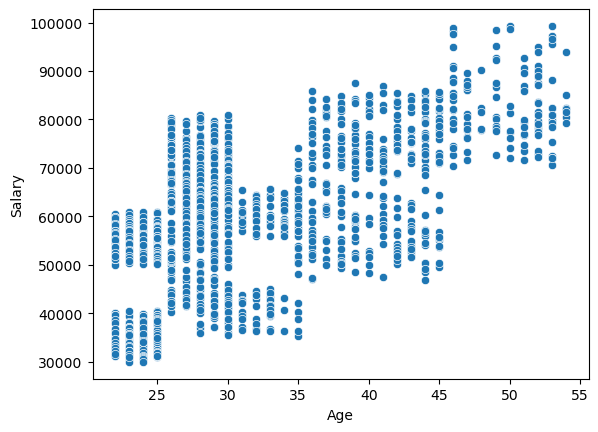

In [52]:
sns.scatterplot(data=df, x='Age', y='Salary');

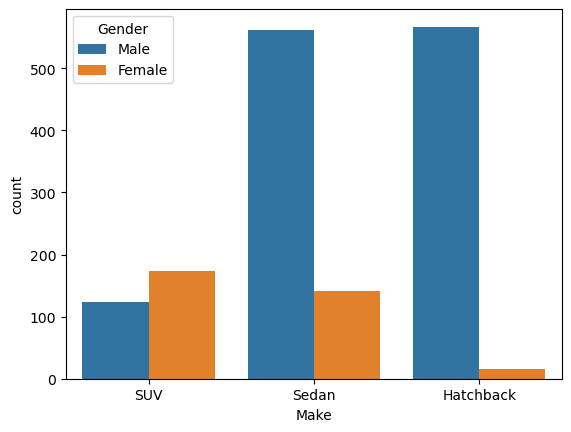

Gender,Female,Male,All
Make,,,
Hatchback,0.948767,35.863378,36.812144
SUV,10.942441,7.843137,18.785579
Sedan,8.918406,35.483871,44.402277
All,20.809614,79.190386,100.000000


In [53]:
sns.countplot(x='Make',hue='Gender', data=df)
plt.show()
pd.crosstab(df['Make'],df['Gender'],margins=True, normalize = True)*100

#### From the above analysis, most male customers are preferring Hatchback model(35.8%) and sedan make(35.4%). For SUV model, when compare to male customers(7.84%), most Female customers (10.94%) have bought SUV model. As per Gender wise analysis, Most male cutomer have bought Hatchback and sedan models and Female customers have bought SUV(10.9%) and Sedan models(8.9%)

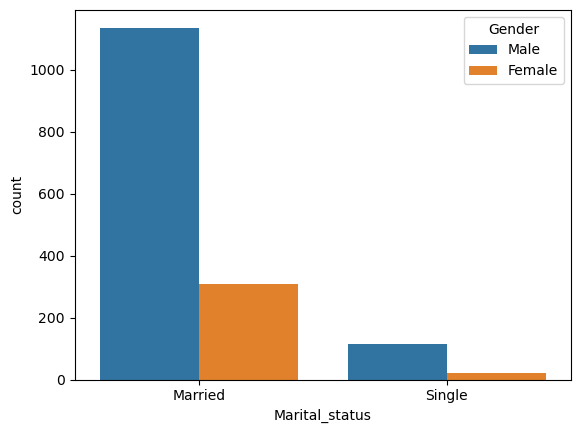

Gender,Female,Male,All
Marital_status,,,
Married,19.418090,71.853257,91.271347
Single,1.391524,7.337128,8.728653
All,20.809614,79.190386,100.000000


In [54]:
sns.countplot(x='Marital_status',hue='Gender', data=df)
plt.show()
pd.crosstab(df['Marital_status'],df['Gender'],margins=True, normalize = True)*100

#### From the above graph, 71.8% males and 19.4%females were married. only 8.7% customers were single. So our most targeted customers should be married customers.

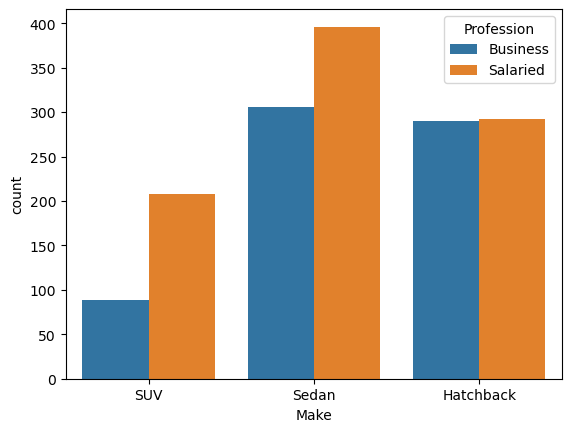

Profession,Business,Salaried,All
Make,,,
Hatchback,18.342821,18.469323,36.812144
SUV,5.629349,13.156230,18.785579
Sedan,19.354839,25.047438,44.402277
All,43.327008,56.672992,100.000000


In [55]:
sns.countplot(x='Make',hue='Profession', data=df)
plt.show()
pd.crosstab(df['Make'],df['Profession'],margins=True, normalize = True)*100

#### From the above plot, Hatchback model was comonly preferred by both Salaried(18.4%) and buisness( 18.3%)class people.
#### when compare to all make and profession category, Sedan model was mostly purchased product by salaried customer.
#### Hatchback and sedan model was most commonly purchased by business class people.
#### So from the analysis, Hatchback and sedan model was most common purchasing product by both Business and salaried customer and these two products were the most moving products.

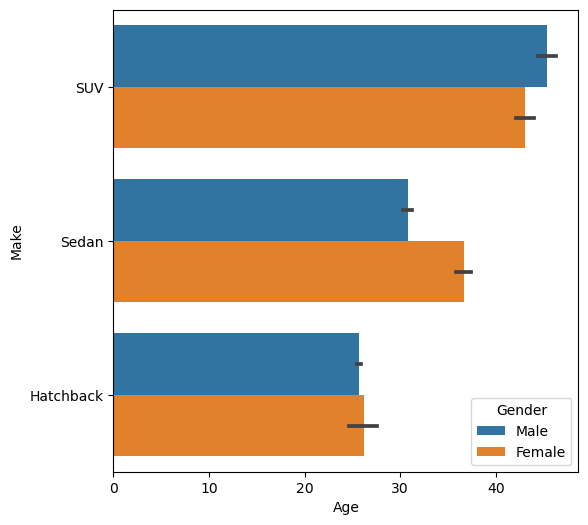

Age  Make       Gender
22   Hatchback  Male       95.522388
                Female      4.477612
     Sedan      Male      100.000000
23   Hatchback  Male       98.591549
                Female      1.408451
     Sedan      Male      100.000000
24   Hatchback  Male       97.222222
                Female      2.777778
     Sedan      Male      100.000000
25   Hatchback  Male      100.000000
     Sedan      Male      100.000000
26   Hatchback  Male       96.875000
                Female      3.125000
     Sedan      Male      100.000000
27   Hatchback  Male       96.923077
                Female      3.076923
     Sedan      Male      100.000000
28   Hatchback  Male      100.000000
     SUV        Female    100.000000
     Sedan      Male       89.285714
                Female     10.714286
29   Hatchback  Male      100.000000
     SUV        Female    100.000000
     Sedan      Male       85.714286
                Female     14.285714
30   Hatchback  Male       90.566038
               

In [56]:
fig_dims = (6, 6)
fig = plt.subplots(figsize=fig_dims)
sns.barplot(x='Age', y='Make', hue='Gender',data=df)
plt.show()
pd.set_option('display.max_rows', None)
df.groupby(['Age', 'Make']).Gender.value_counts(normalize=True)*100

#### From the above plot and metrics, it can be identified that, above age 30 customers has purchased only Sedan and SUV model. customers whose age 46 and above have only purchased SUV model.
#### From the above analysis, Hatchback model products can be targetd for below age 30 customers and SUV model products will partcularly targeted for customers whose age above 45 and targeted customers below age 45 also. And Sedan model will targeted for the customer whose age starts from 22 to 46 or 47.

<AxesSubplot:xlabel='Make', ylabel='Total_salary'>

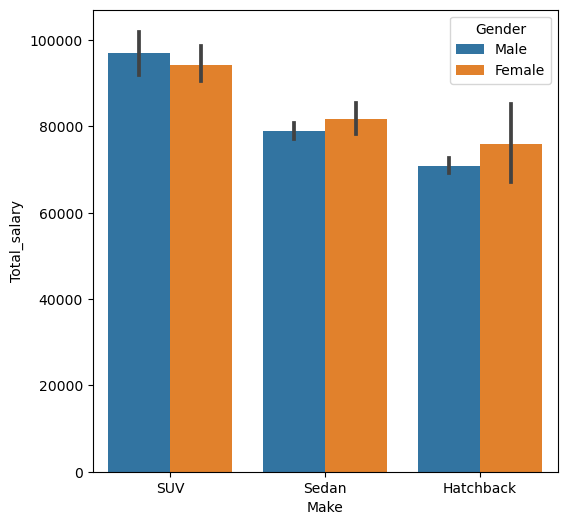

In [57]:
fig_dims = (6, 6)
fig = plt.subplots(figsize=fig_dims)
sns.barplot(x='Make', y='Total_salary', hue='Gender',data=df)

#### From the above plot, it clearly shows that, customers who earning high salary are SUV model and customer earning low salary are purchasing hatchback model.

<AxesSubplot:xlabel='Make', ylabel='Price'>

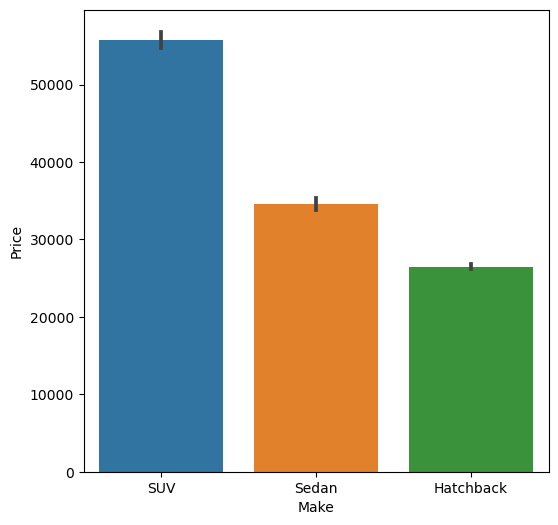

In [58]:
fig_dims = (6, 6)
fig = plt.subplots(figsize=fig_dims)
sns.barplot(x='Make', y='Price', data=df)

In [59]:
pd.crosstab(df['Age'],df['Make'],margins=True, normalize = True)

Make,Hatchback,SUV,Sedan,All
Age,,,,
22,0.042378,0.000000,0.017078,0.059456
23,0.044908,0.000000,0.020240,0.065149
24,0.045541,0.000000,0.020240,0.065781
25,0.050601,0.000000,0.024035,0.074636
26,0.040481,0.000000,0.020240,0.060721
27,0.041113,0.000000,0.020240,0.061354
28,0.038583,0.001265,0.035421,0.075269
29,0.030993,0.003163,0.035421,0.069576
30,0.033523,0.001265,0.039216,0.074004


<AxesSubplot:xlabel='Make', ylabel='Price'>

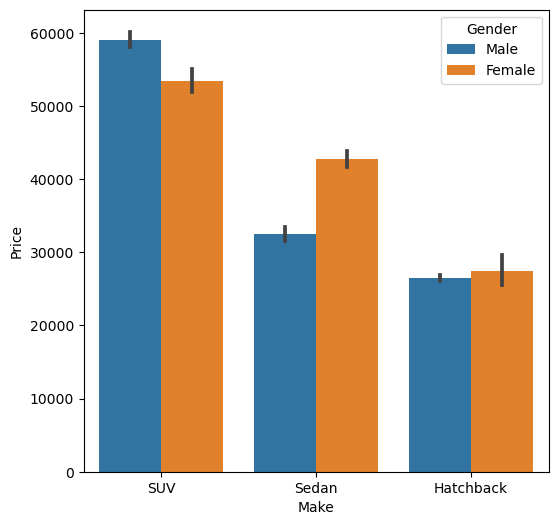

In [60]:
fig_dims = (6, 6)
fig = plt.subplots(figsize=fig_dims)
sns.barplot(x='Make', y='Price', hue='Gender',data=df)

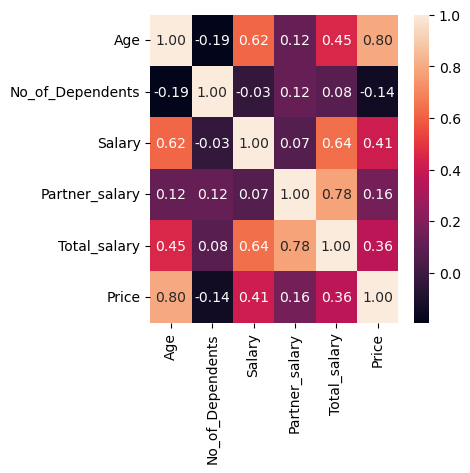

In [61]:
plt.figure(figsize=(4,4))
sns.heatmap(df.corr(),annot=True,fmt=".2f");

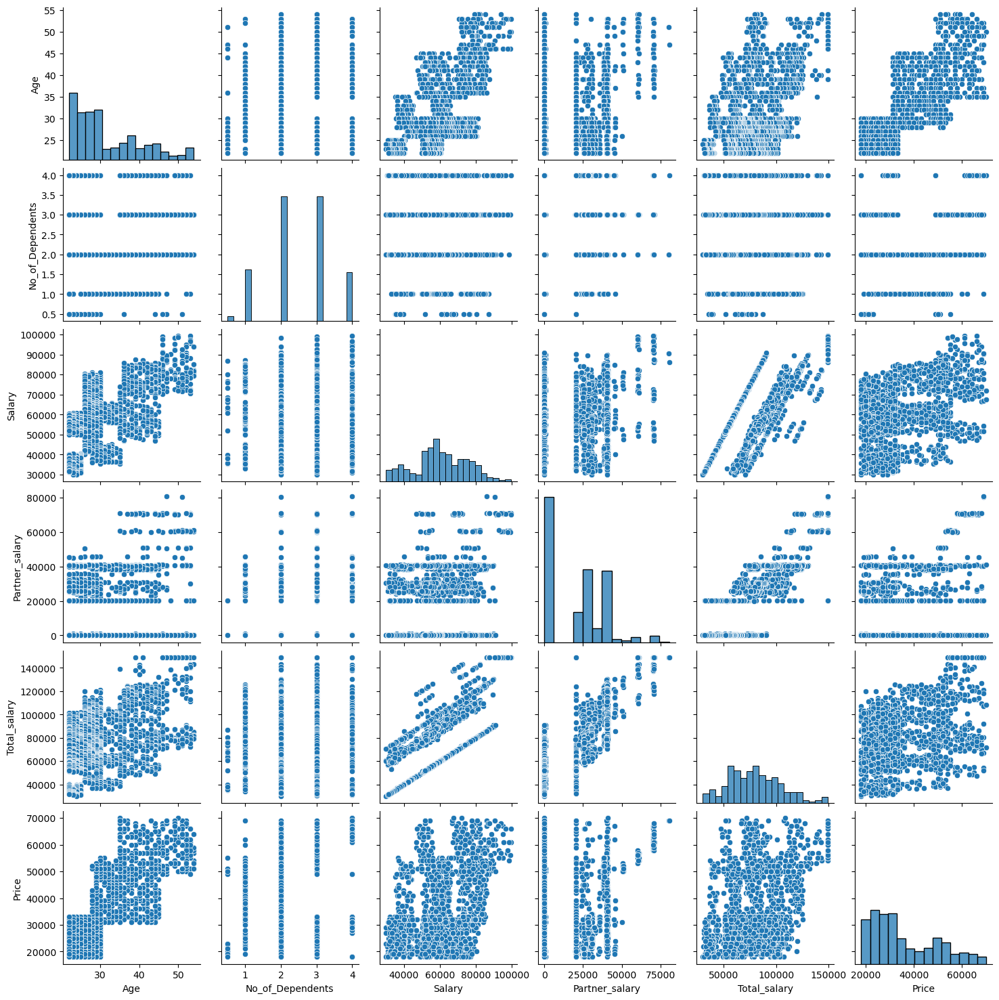

In [62]:
sns.pairplot(df)
plt.show()

### Encoding

In [63]:
df1=df.copy()
dummies=pd.get_dummies(df1[["Gender", "Profession","Marital_status","Education","Personal_loan","House_loan","Partner_working"]], columns=["Gender", "Profession","Marital_status","Education","Personal_loan","House_loan","Partner_working"], prefix=["Gender", "Profession","Marital_status","Education","Personal_loan","House_loan","Partner_working"],drop_first=True)

In [64]:
columns=["Gender", "Profession","Marital_status","Education","Personal_loan","House_loan","Partner_working"]
df1 = pd.concat([df1, dummies], axis=1)

# drop original column "fuel-type" from "df"
df1.drop(columns, axis = 1, inplace=True)

In [65]:
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()
df1['Make']= label_encoder.fit_transform(df['Make'])
  
df1['Make'].unique()

array([1, 2, 0])

In [66]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1581 entries, 0 to 1580
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Age                      1581 non-null   int64  
 1   No_of_Dependents         1581 non-null   float64
 2   Salary                   1581 non-null   int64  
 3   Partner_salary           1581 non-null   float64
 4   Total_salary             1581 non-null   float64
 5   Price                    1581 non-null   int64  
 6   Make                     1581 non-null   int32  
 7   Gender_Male              1581 non-null   uint8  
 8   Profession_Salaried      1581 non-null   uint8  
 9   Marital_status_Single    1581 non-null   uint8  
 10  Education_Post Graduate  1581 non-null   uint8  
 11  Personal_loan_Yes        1581 non-null   uint8  
 12  House_loan_Yes           1581 non-null   uint8  
 13  Partner_working_Yes      1581 non-null   uint8  
dtypes: float64(3), int32(1),

In [67]:
df1.head()

,Age,No_of_Dependents,Salary,Partner_salary,Total_salary,Price,Make,Gender_Male,Profession_Salaried,Marital_status_Single,Education_Post Graduate,Personal_loan_Yes,House_loan_Yes,Partner_working_Yes
0,53,4.0,99300,70700.0,149000.0,61000,1,1,0,0,1,0,0,1
1,53,4.0,95500,70300.0,149000.0,61000,1,0,1,0,1,1,0,1
2,53,3.0,97300,60700.0,149000.0,57000,1,0,1,0,1,0,0,1
3,53,2.0,72500,70300.0,142800.0,61000,1,0,1,0,0,1,0,1
4,53,3.0,79700,60200.0,139900.0,57000,1,1,1,0,1,0,0,1


In [68]:
df1['Gender_Male'] =df1['Gender_Male'].astype('category')
df1['Profession_Salaried'] =df1['Profession_Salaried'].astype('category')
df1['Marital_status_Single'] =df1['Marital_status_Single'].astype('category')
df1['Education_Post Graduate'] =df1['Education_Post Graduate'].astype('category')
df1['Personal_loan_Yes'] =df1['Personal_loan_Yes'].astype('category')
df1['House_loan_Yes'] =df1['House_loan_Yes'].astype('category')
df1['Partner_working_Yes'] =df1['Partner_working_Yes'].astype('category')
df1['Make'] =df1['Make'].astype('category')

In [69]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1581 entries, 0 to 1580
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   Age                      1581 non-null   int64   
 1   No_of_Dependents         1581 non-null   float64 
 2   Salary                   1581 non-null   int64   
 3   Partner_salary           1581 non-null   float64 
 4   Total_salary             1581 non-null   float64 
 5   Price                    1581 non-null   int64   
 6   Make                     1581 non-null   category
 7   Gender_Male              1581 non-null   category
 8   Profession_Salaried      1581 non-null   category
 9   Marital_status_Single    1581 non-null   category
 10  Education_Post Graduate  1581 non-null   category
 11  Personal_loan_Yes        1581 non-null   category
 12  House_loan_Yes           1581 non-null   category
 13  Partner_working_Yes      1581 non-null   category
dtypes: categ

In [70]:
df1.head()

,Age,No_of_Dependents,Salary,Partner_salary,Total_salary,Price,Make,Gender_Male,Profession_Salaried,Marital_status_Single,Education_Post Graduate,Personal_loan_Yes,House_loan_Yes,Partner_working_Yes
0,53,4.0,99300,70700.0,149000.0,61000,1,1,0,0,1,0,0,1
1,53,4.0,95500,70300.0,149000.0,61000,1,0,1,0,1,1,0,1
2,53,3.0,97300,60700.0,149000.0,57000,1,0,1,0,1,0,0,1
3,53,2.0,72500,70300.0,142800.0,61000,1,0,1,0,0,1,0,1
4,53,3.0,79700,60200.0,139900.0,57000,1,1,1,0,1,0,0,1


### Normalizing and Scaling

In [71]:
from sklearn.preprocessing import StandardScaler
std_scale = StandardScaler()
std_scale

StandardScaler()

In [72]:
df1['Age'] = std_scale.fit_transform(df1[['Age']])
df1['No_of_Dependents'] = std_scale.fit_transform(df1[['No_of_Dependents']])
df1['Salary'] = std_scale.fit_transform(df1[['Salary']])
df1['Partner_salary']= std_scale.fit_transform(df1[['Partner_salary']])
df1['Total_salary']= std_scale.fit_transform(df1[['Total_salary']])
df1['Price']= std_scale.fit_transform(df1[['Price']])

In [73]:
df1.head()

,Age,No_of_Dependents,Salary,Partner_salary,Total_salary,Price,Make,Gender_Male,Profession_Salaried,Marital_status_Single,Education_Post Graduate,Personal_loan_Yes,House_loan_Yes,Partner_working_Yes
0,2.502317,1.654464,2.652167,2.670718,2.801846,1.863796,1,1,0,0,1,0,0,1
1,2.502317,1.654464,2.393138,2.649553,2.801846,1.863796,1,0,1,0,1,1,0,1
2,2.502317,0.577155,2.515836,2.141595,2.801846,1.570311,1,0,1,0,1,0,0,1
3,2.502317,-0.500155,0.825333,2.649553,2.552261,1.863796,1,0,1,0,0,1,0,1
4,2.502317,0.577155,1.316124,2.115139,2.435520,1.570311,1,1,1,0,1,0,0,1


In [74]:
df.head()

,Age,Gender,Profession,Marital_status,Education,No_of_Dependents,Personal_loan,House_loan,Partner_working,Salary,Partner_salary,Total_salary,Price,Make
0,53,Male,Business,Married,Post Graduate,4.0,No,No,Yes,99300,70700.0,149000.0,61000,SUV
1,53,Female,Salaried,Married,Post Graduate,4.0,Yes,No,Yes,95500,70300.0,149000.0,61000,SUV
2,53,Female,Salaried,Married,Post Graduate,3.0,No,No,Yes,97300,60700.0,149000.0,57000,SUV
3,53,Female,Salaried,Married,Graduate,2.0,Yes,No,Yes,72500,70300.0,142800.0,61000,SUV
4,53,Male,Salaried,Married,Post Graduate,3.0,No,No,Yes,79700,60200.0,139900.0,57000,SUV


### F. From the given data, comment on the amount spent on purchasing automobiles across the following categories. Comment on how a Business can utilize the results from this exercise. Give justification along with presenting metrics/charts used for arriving at the conclusions.

Give justification along with presenting metrics/charts used for arriving at the conclusions.

F1) Gender

F2) Personal_loan

<AxesSubplot:xlabel='Make', ylabel='count'>

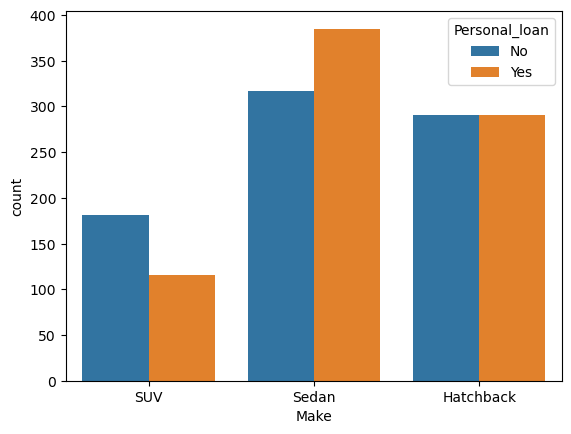

In [75]:
sns.countplot(x='Make',hue='Personal_loan', data=df)

In [76]:
pd.crosstab(df['Make'],df['Personal_loan'],margins=True, normalize = True)

Personal_loan,No,Yes,All
Make,,,
Hatchback,0.184061,0.184061,0.368121
SUV,0.114485,0.073371,0.187856
Sedan,0.200506,0.243517,0.444023
All,0.499051,0.500949,1.000000


In [77]:
#pd.crosstab(df['Gender'],df['Personal_loan'],margins=True, normalize = True)
pd.set_option('display.max_rows', None)
df.groupby(['Gender', 'Price']).Personal_loan.value_counts(normalize=True)*100

Gender  Price  Personal_loan
Female  20000  No               100.000000
        22000  No               100.000000
        23000  No               100.000000
        25000  No               100.000000
        27000  Yes              100.000000
        28000  No               100.000000
        29000  Yes              100.000000
        30000  Yes              100.000000
        31000  No                50.000000
               Yes               50.000000
        32000  Yes               52.941176
               No                47.058824
        33000  No                54.545455
               Yes               45.454545
        34000  No                85.714286
               Yes               14.285714
        35000  No                50.000000
               Yes               50.000000
        36000  No                62.500000
               Yes               37.500000
        37000  No                60.000000
               Yes               40.000000
        38000  No        

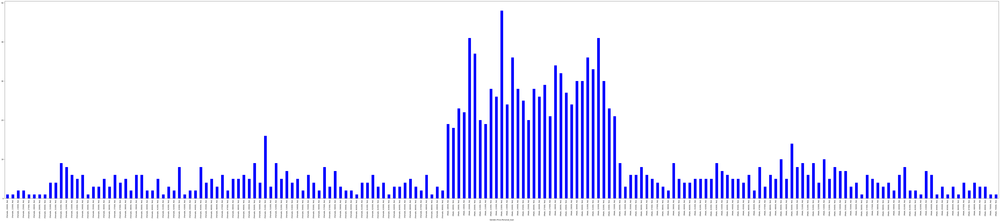

In [78]:
plt.figure(figsize=(100,20))
groups1 = df.groupby(["Gender", "Price"]).Personal_loan.value_counts()
groups1.plot.bar(color="blue")
plt.xticks(rotation=90);
pd.set_option('display.max_rows', None)
plt.show()

In [79]:
pd.crosstab(df['Gender'],df['Personal_loan'],margins=True, normalize = True)*100

Personal_loan,No,Yes,All
Gender,,,
Female,11.385199,9.424415,20.809614
Male,38.519924,40.670462,79.190386
All,49.905123,50.094877,100.000000


In [80]:
pd.crosstab(index = df['Price'],  \
                      columns = [df['Personal_loan'], df['Gender']] , \
                      normalize=True, margins = True, \
                      margins_name= "Total") *100

Personal_loan         No                  Yes                  Total
Gender            Female       Male    Female       Male            
Price                                                               
18000           0.000000   1.201771  0.000000   1.138520    2.340291
19000           0.000000   1.391524  0.000000   1.454775    2.846300
20000           0.063251   2.593295  0.000000   2.340291    4.996837
21000           0.000000   1.201771  0.000000   1.265022    2.466793
22000           0.063251   1.644529  0.000000   1.771031    3.478811
23000           0.126502   1.518027  0.000000   3.036053    4.680582
24000           0.000000   1.771031  0.000000   2.277040    4.048071
25000           0.126502   1.265022  0.000000   1.581278    2.972802
26000           0.000000   1.644529  0.000000   1.771031    3.415560
27000           0.000000   1.328273  0.063251   1.834282    3.225806
28000           0.063251   2.150538  0.000000   2.024035    4.237824
29000           0.000000   1.518027  0.063251   1.707780    3.289058
30000           0.000000   1.897533  0.063251   1.897533    3.858318
31000           0.253004   2.277040  0.253004   2.087287    4.870335
32000           0.506009   2.593295  0.569260   1.897533    5.566097
33000           0.379507   1.328273  0.316256   1.454775    3.478811
34000           0.379507   0.189753  0.063251   0.569260    1.201771
35000           0.189753   0.379507  0.189753   0.379507    1.138520
36000           0.316256   0.379507  0.189753   0.506009    1.391524
37000           0.379507   0.253004  0.253004   0.316256    1.201771
38000           0.316256   0.126502  0.126502   0.189753    0.759013
39000           0.379507   0.569260  0.379507   0.316256    1.644529
40000           0.126502   0.253004  0.126502   0.253004    0.759013
41000           0.063251   0.316256  0.316256   0.316256    1.012018
42000           0.126502   0.316256  0.189753   0.316256    0.948767
43000           0.063251   0.442758  0.506009   0.569260    1.581278
44000           0.126502   0.316256  0.126502   0.379507    0.948767
45000           0.253004   0.253004  0.506009   0.316256    1.328273
46000           0.189753   0.126502  0.316256   0.379507    1.012018
47000           0.379507   0.189753  0.126502   0.506009    1.201771
48000           0.316256   0.316256  0.316256   0.379507    1.328273
49000           0.316256   0.316256  0.379507   0.632511    1.644529
50000           0.253004   0.506009  0.569260   0.885515    2.213789
51000           0.189753   0.569260  1.012018   0.379507    2.150538
52000           0.569260   0.253004  0.316256   0.569260    1.707780
53000           0.442758   0.632511  0.253004   0.316256    1.644529
54000           0.316256   0.442758  0.126502   0.506009    1.391524
55000           0.379507   0.189753  0.253004   0.442758    1.265022
56000           0.126502   0.253004  0.000000   0.063251    0.442758
57000           0.506009   0.316256  0.189753   0.379507    1.391524
58000           0.442758   0.253004  0.000000   0.189753    0.885515
59000           0.189753   0.126502  0.126502   0.253004    0.695762
60000           0.126502   0.379507  0.063251   0.000000    0.569260
61000           0.253004   0.506009  0.253004   0.126502    1.138520
62000           0.379507   0.063251  0.189753   0.126502    0.759013
63000           0.253004   0.442758  0.063251   0.000000    0.759013
64000           0.189753   0.379507  0.189753   0.063251    0.822264
65000           0.253004   0.189753  0.000000   0.063251    0.506009
66000           0.316256   0.189753  0.189753   0.063251    0.759013
67000           0.126502   0.253004  0.000000   0.126502    0.506009
68000           0.379507   0.253004  0.063251   0.000000    0.695762
69000           0.189753   0.189753  0.126502   0.189753    0.695762
70000           0.000000   0.063251  0.000000   0.063251    0.126502
Total          11.385199  38.519924  9.424415  40.670462  100.000000

### G. From the current data set comment if having a working partner leads to the purchase of a higher-priced car.

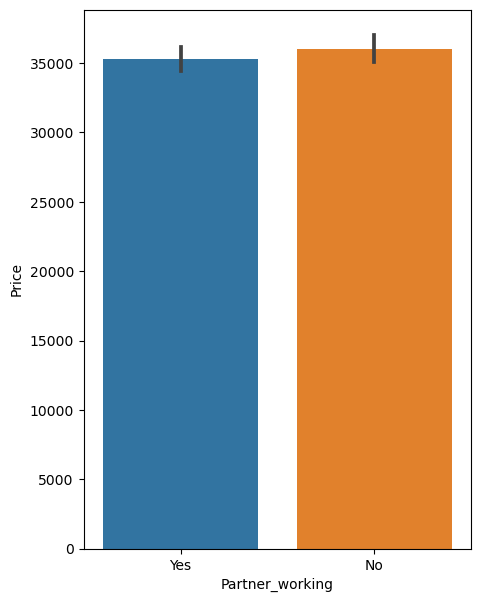

Partner_working,No,Yes,All
Price,,,
18000,1.012018,1.328273,2.340291
19000,1.075269,1.771031,2.846300
20000,2.024035,2.972802,4.996837
21000,1.012018,1.454775,2.466793
22000,1.518027,1.960784,3.478811
23000,2.403542,2.277040,4.680582
24000,1.834282,2.213789,4.048071
25000,1.707780,1.265022,2.972802
26000,1.391524,2.024035,3.415560


In [81]:
plt.figure(figsize=(5,7))
sns.barplot(x='Partner_working', y='Price',data=df)
plt.show()
pd.crosstab(df['Price'],df['Partner_working'],margins=True, normalize = True)*100

### (H)The main objective of this analysis is to devise an improved marketing strategy to send targeted information to different groups of potential buyers present in the data. For the current analysis use the Gender and Marital_status - fields to arrive at groups with similar purchase history.

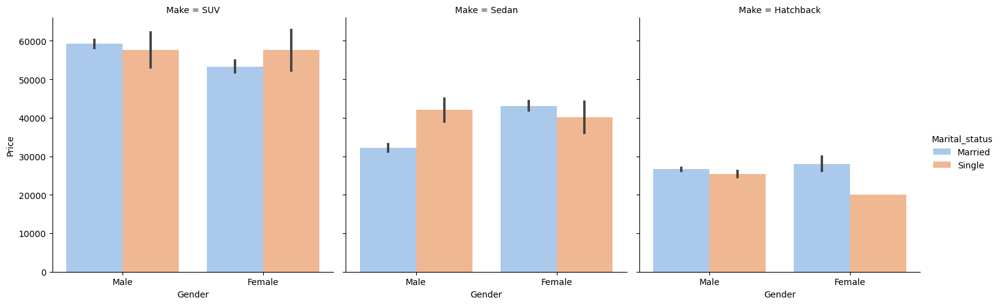

In [82]:
sns.catplot(data=df, x="Gender", y="Price", col="Make", hue="Marital_status", kind='bar', palette='pastel');

In [83]:
df.groupby(["Gender", "Marital_status"]).Make.value_counts()

Gender  Marital_status  Make     
Female  Married         SUV          166
                        Sedan        127
                        Hatchback     14
        Single          Sedan         14
                        SUV            7
                        Hatchback      1
Male    Married         Sedan        537
                        Hatchback    484
                        SUV          115
        Single          Hatchback     83
                        Sedan         24
                        SUV            9
Name: Make, dtype: int64

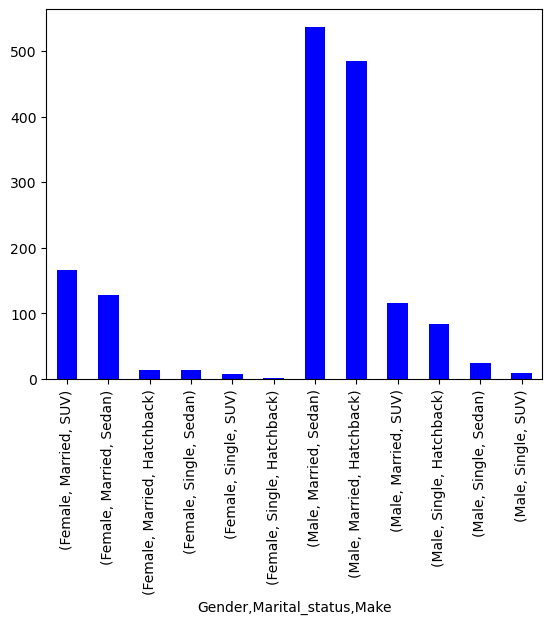

In [84]:
groups = df.groupby(["Gender", "Marital_status"]).Make.value_counts()
groups.plot.bar(color="blue")
plt.show()

In [96]:
bk=pd.read_excel("godigt_cc_data.xlsx")
pd.set_option('display.max_columns', None)
bk

,userid,card_no,card_bin_no,Issuer,card_type,card_source_date,high_networth,active_30,active_60,active_90,cc_active30,cc_active60,cc_active90,hotlist_flag,widget_products,engagement_products,annual_income_at_source,other_bank_cc_holding,bank_vintage,T+1_month_activity,T+2_month_activity,T+3_month_activity,T+6_month_activity,T+12_month_activity,Transactor_revolver,avg_spends_l3m,Occupation_at_source,cc_limit
0,1,4384 39XX XXXX XXXX,438439,Visa,edge,2019-09-29,B,0,1,1,0,0,0,N,1,3,1552111,Y,27,0,0,0,0,0,T,27729,Self Employed,290000
1,2,4377 48XX XXXX XXXX,437748,Visa,prosperity,2002-10-30,A,1,1,1,0,0,0,N,4,1,4833871,Y,52,0,0,0,0,0,R,280854,0,950000
2,3,4377 48XX XXXX XXXX,437748,Visa,rewards,2013-10-05,C,0,0,0,0,0,0,N,4,2,1345429,N,23,1,0,0,0,0,R,70587,Student,210000
3,4,4258 06XX XXXX XXXX,425806,Visa,indianoil,1999-06-01,E,0,1,1,1,1,1,N,6,0,880560,N,49,0,0,1,0,0,T,9156,Self Employed,80000
4,5,4377 48XX XXXX XXXX,437748,Visa,edge,2006-06-13,B,1,1,1,0,1,1,N,4,3,1808582,N,21,1,0,0,0,0,T,38108,Salaried,220000
5,6,5241 78XX XXXX XXXX,524178,Mastercard,cashback,2015-01-28,E,0,0,1,0,1,1,N,3,5,847505,N,13,0,0,0,0,0,R,44515,Retired,50000
6,7,4055 33XX XXXX XXXX,405533,Visa,cashback,2013-11-08,E,1,1,1,0,0,0,N,6,5,390508,N,9,0,0,0,0,0,T,15779,Retired,20000
7,8,4375 51XX XXXX XXXX,437551,Visa,edge,2014-12-27,B,0,1,1,1,1,1,N,5,3,1986565,N,60,0,0,0,0,0,T,40290,Salaried,260000
8,9,4377 48XX XXXX XXXX,437748,Visa,cashback,2015-07-15,D,0,0,1,0,0,0,N,5,4,1220369,Y,43,0,0,0,0,0,T,56123,Housewife,120000
9,10,4386 28XX XXXX XXXX,438628,Visa,shoprite,2000-09-20,D,0,0,0,1,1,1,N,7,6,1229948,Y,10,0,0,0,0,0,T,9453,Salaried,80000


In [97]:
bk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8448 entries, 0 to 8447
Data columns (total 28 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   userid                   8448 non-null   int64         
 1   card_no                  8448 non-null   object        
 2   card_bin_no              8448 non-null   int64         
 3   Issuer                   8448 non-null   object        
 4   card_type                8448 non-null   object        
 5   card_source_date         8448 non-null   datetime64[ns]
 6   high_networth            8448 non-null   object        
 7   active_30                8448 non-null   int64         
 8   active_60                8448 non-null   int64         
 9   active_90                8448 non-null   int64         
 10  cc_active30              8448 non-null   int64         
 11  cc_active60              8448 non-null   int64         
 12  cc_active90              8448 non-

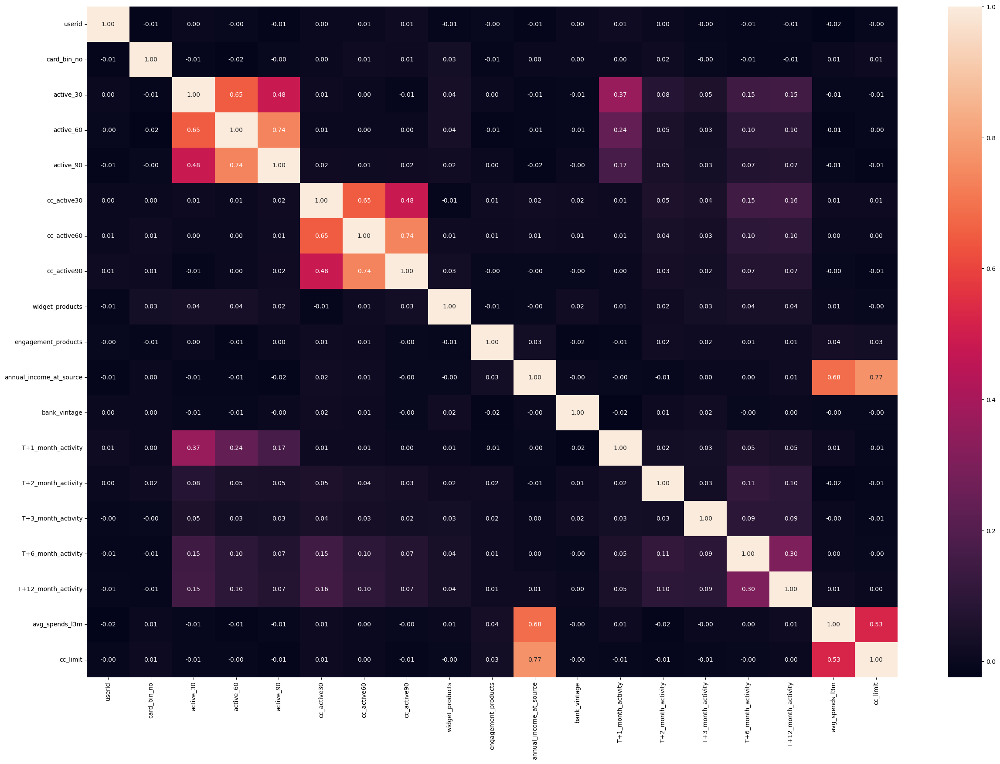

In [98]:
plt.figure(figsize=(30,20))
sns.heatmap(bk.corr(),annot=True,fmt=".2f");

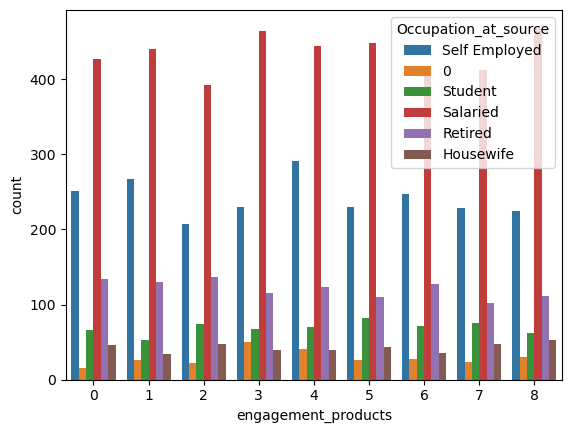

Occupation_at_source,0,Housewife,Retired,Salaried,Self Employed,Student
engagement_products,,,,,,
0,15,46,134,427,251,66
1,26,34,130,440,267,53
2,22,47,137,392,207,74
3,50,39,115,465,230,67
4,41,40,123,445,291,70
5,26,43,110,449,230,82
6,27,35,127,418,247,72
7,24,47,102,413,228,75
8,30,53,111,469,224,62


In [99]:
sns.countplot(x='engagement_products',hue='Occupation_at_source', data=bk)
plt.show()
pd.crosstab(bk['engagement_products'], bk['Occupation_at_source'])

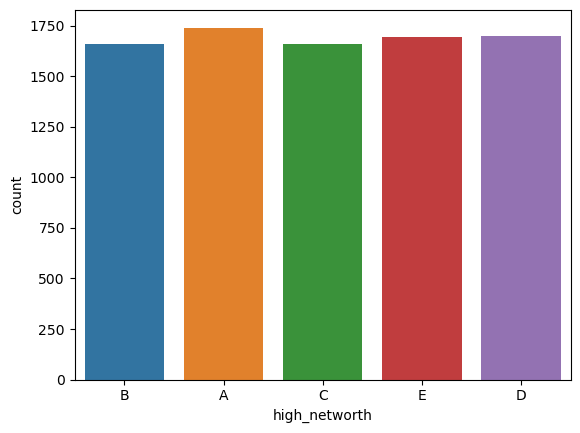

A    20.596591
D    20.075758
E    20.040246
B    19.649621
C    19.637784
Name: high_networth, dtype: float64

In [100]:
sns.countplot(data=bk, x='high_networth')
plt.show()
bk['high_networth'].value_counts(normalize=True)*100

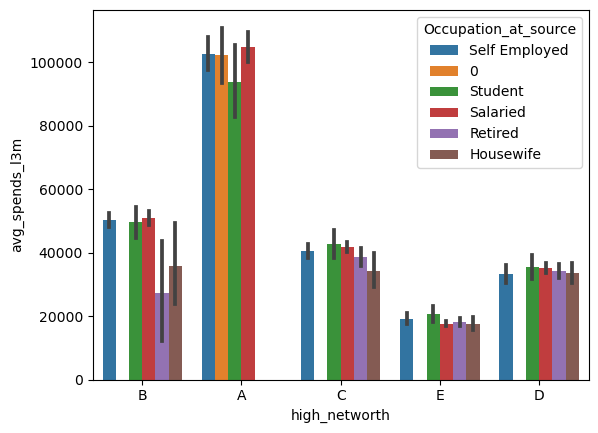

high_networth  avg_spends_l3m  Occupation_at_source
A              0               Salaried                5
                               Retired                 3
                               Self Employed           3
                               0                       1
               251             Student                 1
               285             Self Employed           1
               300             Self Employed           1
               615             Salaried                1
               624             Self Employed           1
               735             Student                 1
               811             Salaried                1
               1002            0                       1
               1003            Self Employed           1
               1070            Salaried                1
               1192            Salaried                1
               1258            Self Employed           1
               1433            Self 

In [101]:
sns.barplot(x='high_networth', y='avg_spends_l3m', hue='Occupation_at_source',data=bk)
plt.show()
pd.set_option('display.max_rows', None)
bk.groupby(['high_networth', 'avg_spends_l3m']).Occupation_at_source.value_counts()

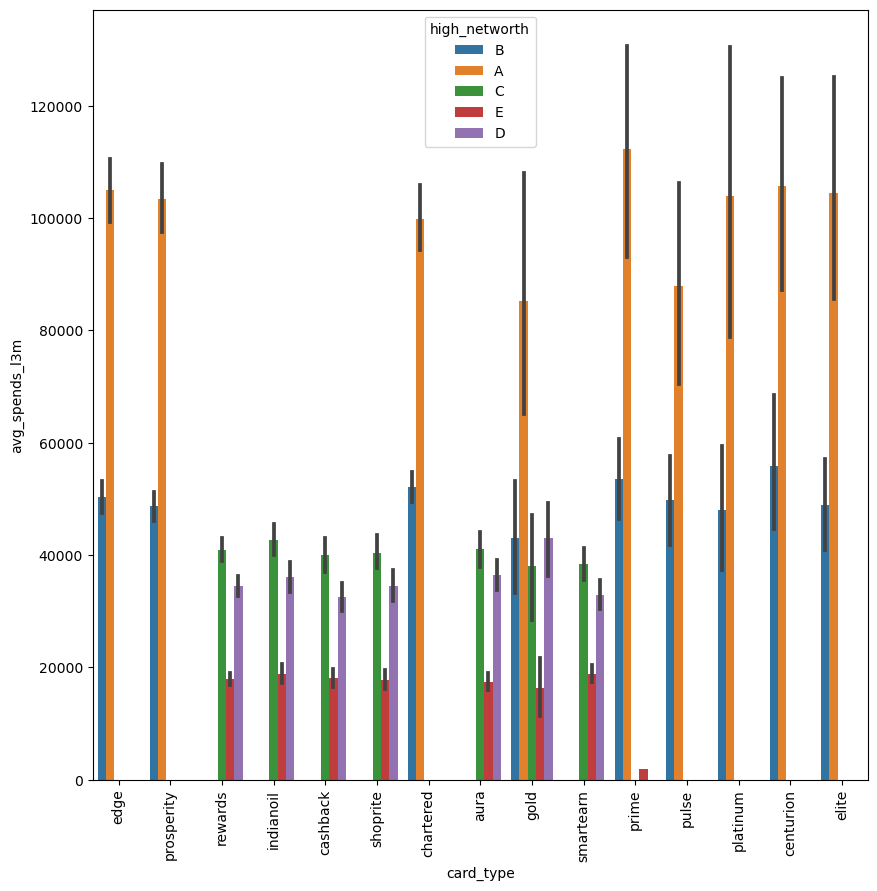

In [102]:
plt.figure(figsize=(10,10))
sns.barplot(x='card_type',y='avg_spends_l3m',hue='high_networth', data=bk)
plt.xticks(rotation=90);
plt.show()

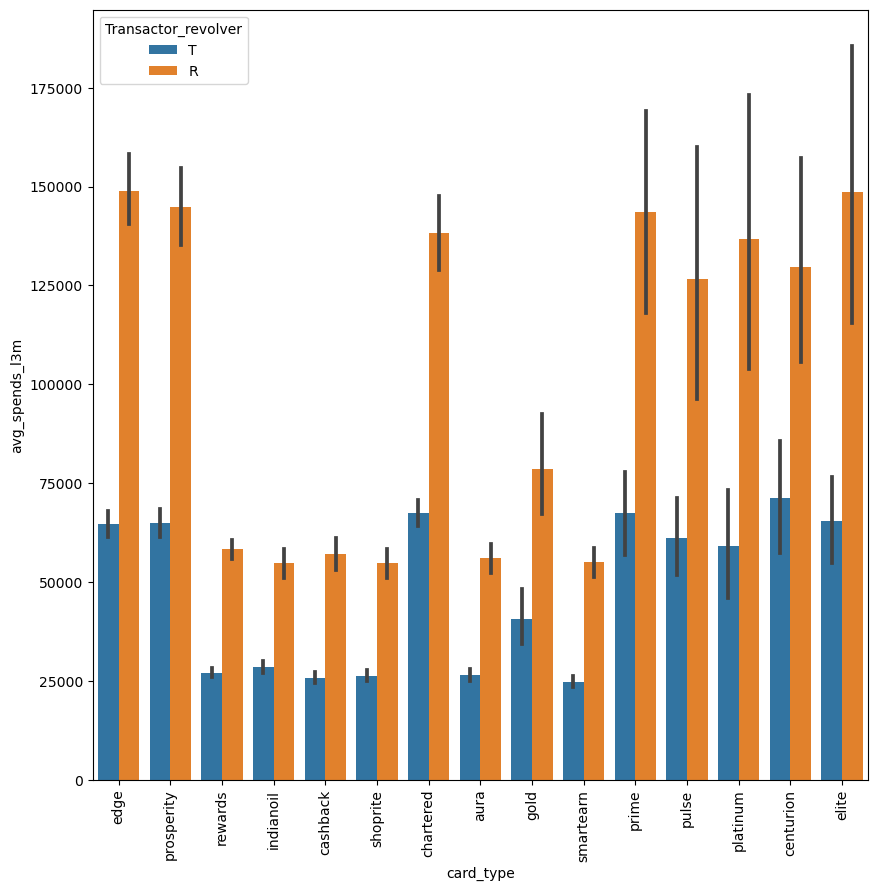

In [103]:
plt.figure(figsize=(10,10))
sns.barplot(x='card_type',y='avg_spends_l3m',hue='Transactor_revolver', data=bk)
plt.xticks(rotation=90);
plt.show()

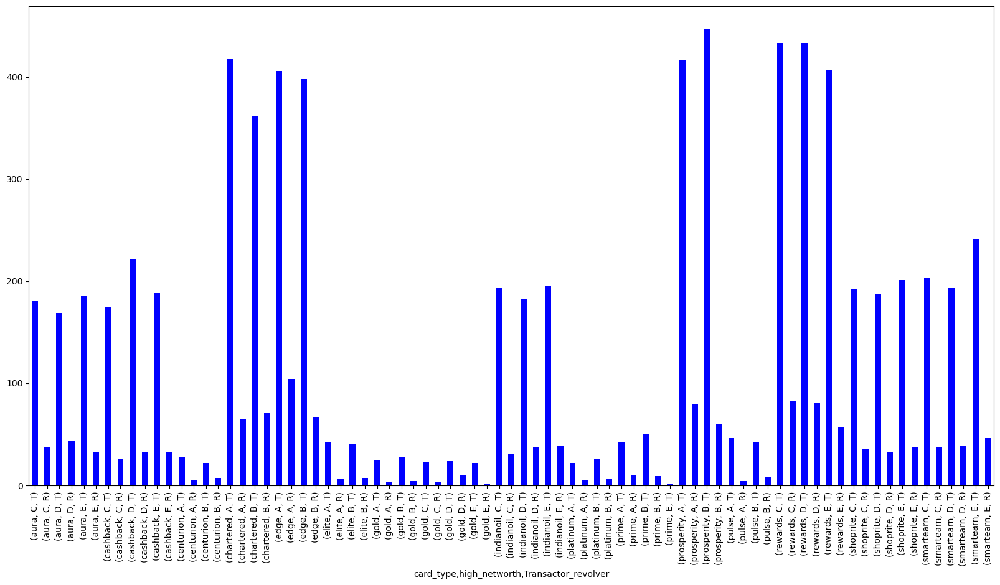

In [104]:
plt.figure(figsize=(20,10))
groups2 = bk.groupby(["card_type", "high_networth"]).Transactor_revolver.value_counts()
groups2.plot.bar(color="blue")
plt.xticks(rotation=90);
plt.show()

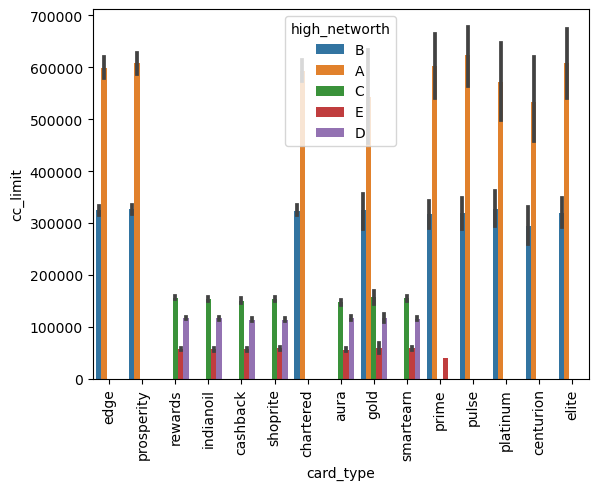

In [105]:
sns.barplot(x='card_type',y='cc_limit',hue='high_networth', data=bk)
plt.xticks(rotation=90);
plt.show()

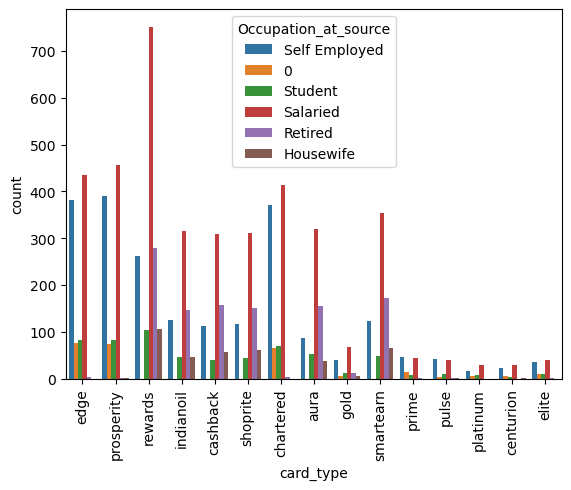

In [106]:
sns.countplot(x='card_type',hue='Occupation_at_source', data=bk)
plt.xticks(rotation=90);
plt.show()